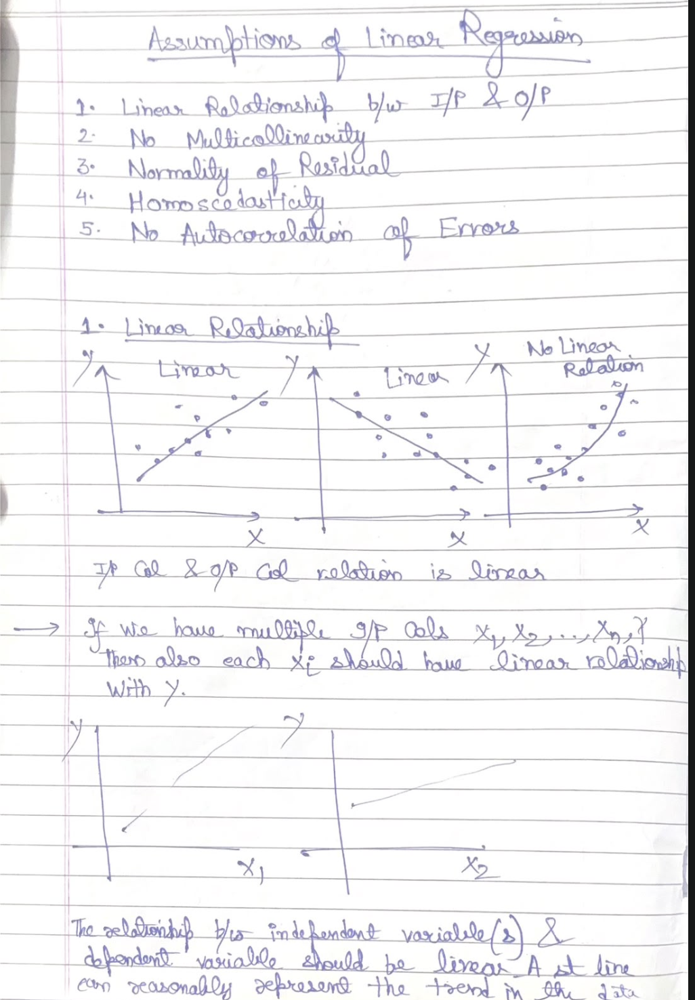

In [7]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

df=pd.read_csv('/Users/priyanshugupta/Desktop/Machine Learning/Supervised/Regression/Linear Regression /Datasets/data.csv')
df

,feature1,feature2,feature3,target
0,-0.570563,1.420342,0.495580,-9.763182
1,-0.990563,0.556965,1.045064,-24.029355
2,-0.674728,0.150617,1.774645,45.616421
3,0.388250,-0.387127,-0.110229,34.135737
4,1.167882,-0.024104,0.145063,86.663647
...,...,...,...,...
195,0.255081,-0.231497,-0.239632,38.067836
196,0.276068,-0.648411,-0.077441,12.812755
197,0.122250,-1.157383,0.765721,70.454115
198,-0.914822,-0.897140,-0.784205,-93.235783


In [10]:
X = df.iloc[:,0:3].values
y = df.iloc[:,-1].values

from sklearn.model_selection import train_test_split

X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=42)

In [11]:
from sklearn.linear_model import LinearRegression
model=LinearRegression()

model.fit(X_train,y_train)

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [12]:
## Residual

y_pred= model.predict(X_test)

residual = y_pred - y_test  ## ( y_cap - y)

In [13]:
residual

array([ 12.94685756,  17.21771138,  -1.76669512,  26.55847379,
       -24.4780775 ,  -0.36143191,  18.98969935,  29.27301617,
         4.81896089,   4.71037201,  20.15944225, -17.42078308,
       -15.9134979 ,  18.79615267, -12.67530125, -19.20453733,
       -12.55146308, -16.65871361,  -3.01891599,  32.45534286,
        -9.48721702, -11.21253809,   1.02932558, -20.53565876,
        38.29392098,   8.07466401, -45.43650235,  27.11182967,
        -7.63888041,  -7.05310592, -13.21010503,  18.59642181,
       -15.86585836,   9.13475832,  -5.50138486,  -3.2152343 ,
        35.36080321,  24.62369179,  15.92736716,  15.58787503])

## Linear Relationship between input and output

Text(0.5, 1.0, 'Feature 3')

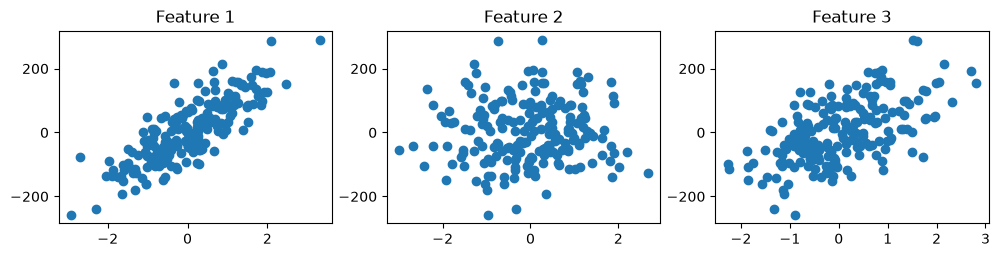

In [18]:
fig, (ax1,ax2,ax3) = plt.subplots(ncols=3,figsize=(12,2.5))

ax1.scatter(df['feature1'],df['target'])
ax1.set_title('Feature 1')
ax2.scatter(df['feature2'],df['target'])
ax2.set_title('Feature 2')
ax3.scatter(df['feature3'],df['target'])
ax3.set_title('Feature 3')


In [19]:
## feature 1 has perfect linear relationship 
## feature 2 doesn't have linear relationship
## feature 3 does have a little linear relationship

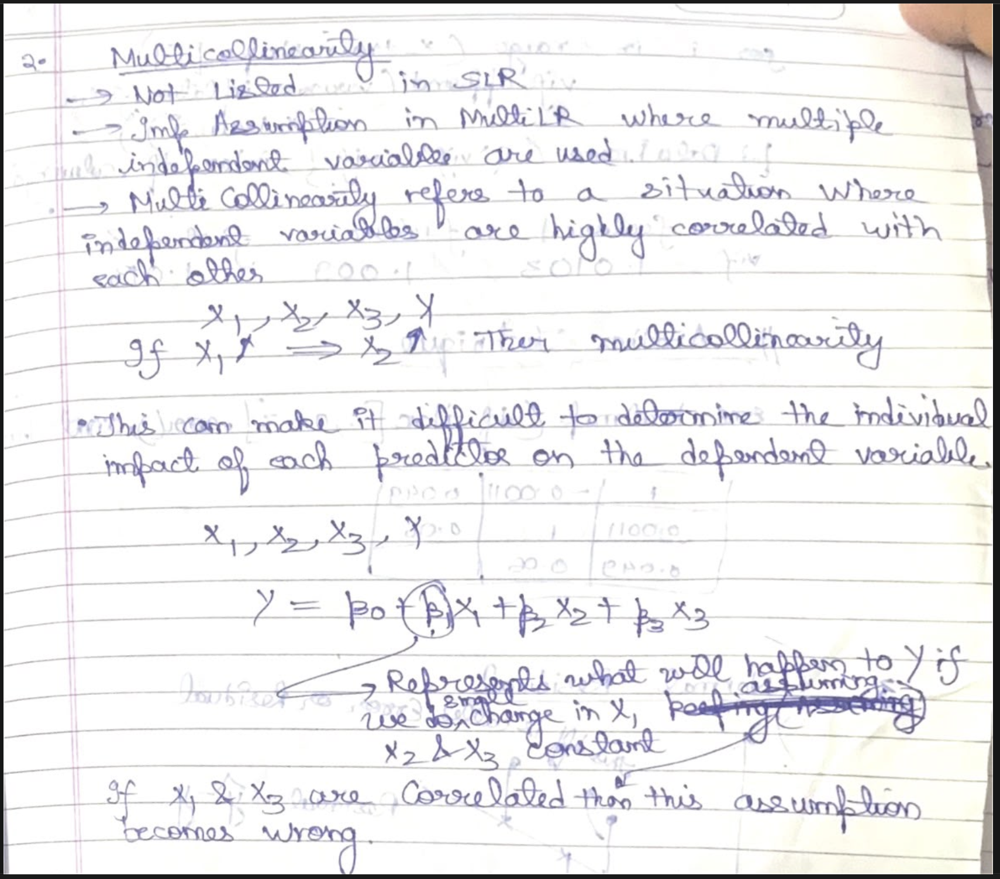

## To detect Multicollinearity

In [23]:
from statsmodels.stats.outliers_influence import variance_inflation_factor 
## if vif is 1 for most of the columns then no multicollinearity , if vif > 5 then multicollinearity exists

vif=[]

In [24]:
X_train.shape[1]    

3

In [25]:
X_train

array([[-1.29804664e+00,  2.67611247e+00, -2.61240485e-01],
       [ 1.22249745e-01, -1.15738338e+00,  7.65721072e-01],
       [ 1.86081167e+00,  2.55590486e-01,  8.15604466e-01],
       [ 2.94532137e-01, -6.53138162e-01,  1.37165804e+00],
       [-5.88501620e-01, -1.54655582e+00, -5.60373419e-01],
       [ 2.55080695e-01, -2.31497410e-01, -2.39632073e-01],
       [-3.84663176e-01,  4.36586883e-02,  3.80335059e-01],
       [ 2.87657229e-01, -1.79480704e+00, -2.27224411e+00],
       [ 4.86414475e-01,  8.51518950e-01, -6.89960677e-01],
       [ 3.31430424e+00,  2.53545675e-01,  1.51791626e+00],
       [-1.68090099e-01,  1.90927681e+00, -7.37464837e-01],
       [-2.37337476e-01,  8.85339675e-01,  1.31516722e+00],
       [-8.89888979e-01, -1.58094538e+00, -4.22792727e-01],
       [-1.63929625e+00,  3.62803486e-01, -1.11278115e+00],
       [-1.50823042e-01,  1.14153310e+00,  9.49133840e-01],
       [ 1.98848968e+00,  1.19505834e+00, -7.82709043e-01],
       [-8.37631447e-01,  1.83915189e+00

In [ ]:
for i in range(X_train.shape[1]):
    vif.append(variance_inflation_factor(X_train,i))


In [28]:
vif

[np.float64(1.0019497109290074),
 np.float64(1.0112734765863598),
 np.float64(1.0112111183384132)]

In [46]:
pd.DataFrame({'vif':vif},index=df.columns[0:3]).T

,feature1,feature2,feature3
vif,1.00195,1.011273,1.011211


In [ ]:
## Another technique of heatmap

<Axes: >

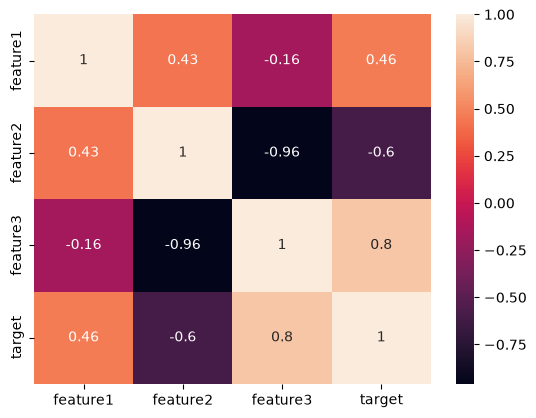

In [47]:
sns.heatmap(df.iloc[0:3].corr(),annot=True)

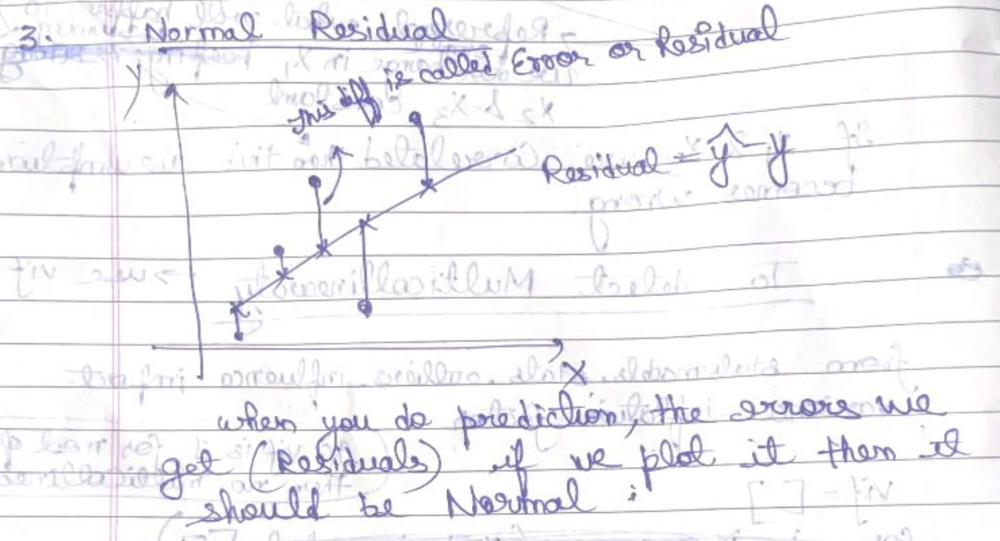

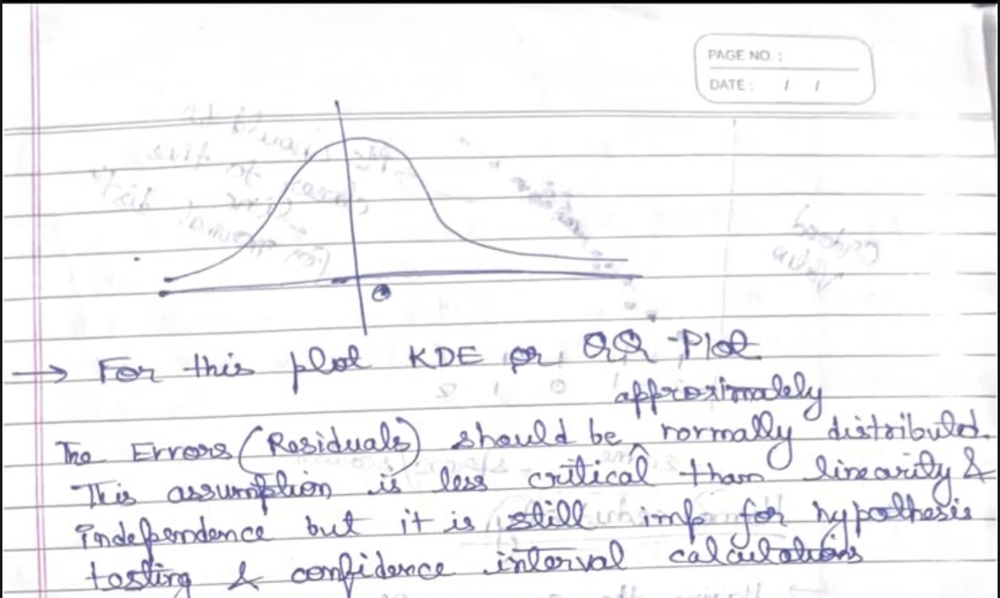

## Normality of Residuals

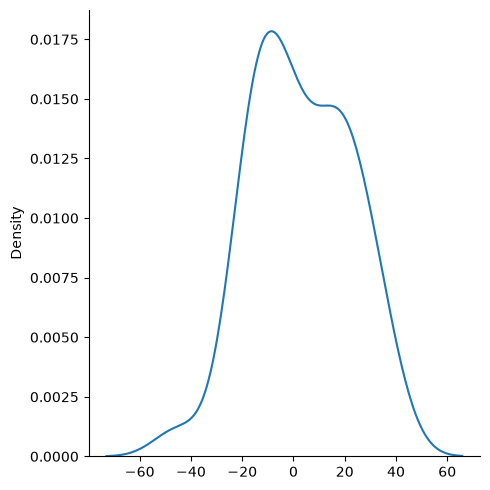

In [50]:
## kde plot
sns.displot(residual,kind='kde')

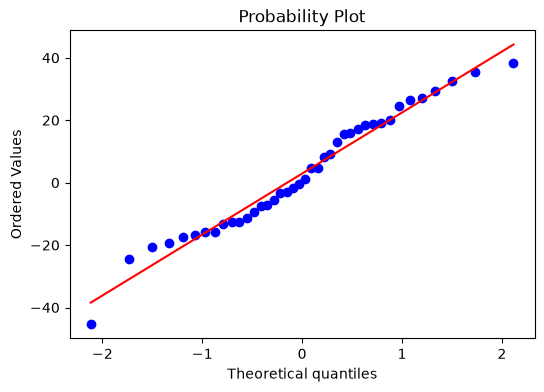

In [52]:
## QQ plot

import scipy as sp 
fig, ax = plt.subplots(figsize=(6,4))
sp.stats.probplot(residual,fit=True, plot=ax)
plt.show()

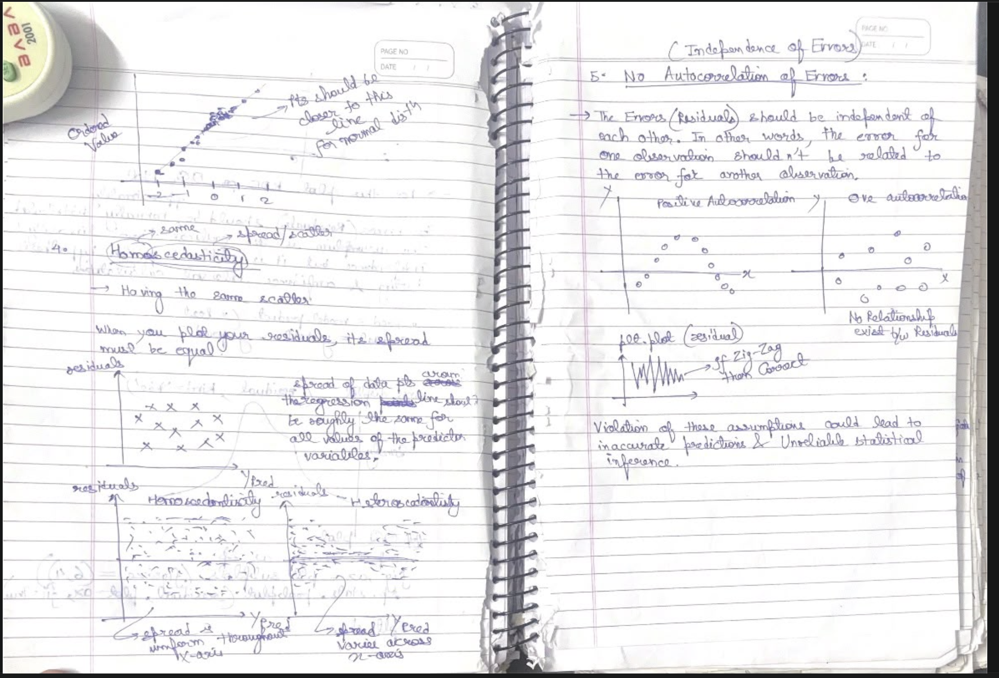

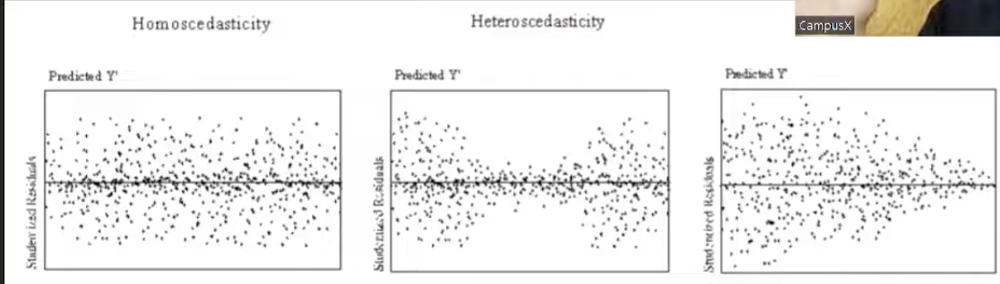

## Homoscedasticity

Text(0, 0.5, 'Residuals')

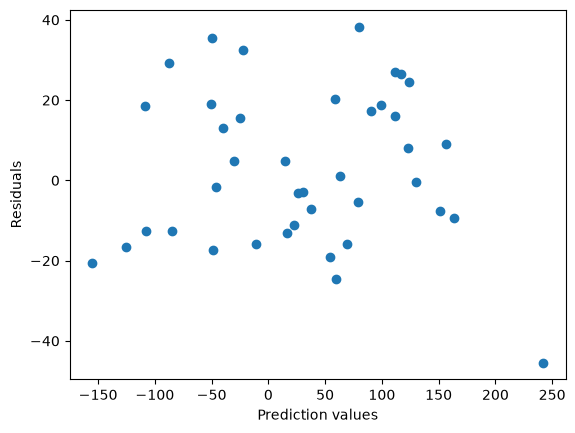

In [55]:
plt.scatter(x=y_pred,y=residual)
plt.xlabel('Prediction values')
plt.ylabel('Residuals')

## Autocorrelation of errors

In [ ]:
## if you plot residual errors then there shouldn't be any pattern 

Text(0.5, 0, 'Residual id')

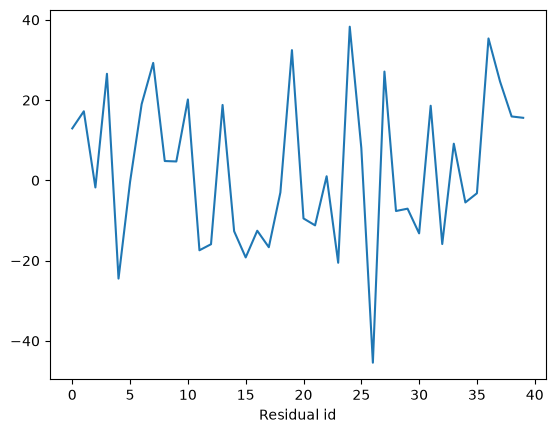

In [61]:
plt.plot(residual) 
plt.xlabel('Residual id')
## zigzag is good